<center
style= "font-family: Calibri; 
    font-weight:bold; 
    letter-spacing: 0px; 
    color: #1a237e; 
    border-radius:20px; 
    font-size:360%; 
    text-align:center;
    padding:3.0px; 
    background:#fc5a8d;
    border-top: 13px solid k;
    border-left: 10px solid k; 
    border-right: -5px solid gold">  <span style="color: gold;">XGBOOST</span>  Prediction of Diabetes
    <img src="https://www.kaggle.com/competitions/91723/images/header" width="280" style="border: 1px solid  #1a237e; border-radius: 1px" loading="lazy" 
    />
</center>

# <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 1. Introduction </p>

<p style="
  font-family: Calibri;
  font-weight: bold;
  letter-spacing: 0.5px;
  color: gold;
  border-radius: 15px;
  font-size: 150%;
  text-align: left;
  padding: 10px;
  background: #1a237e;
  border-bottom: 5px #e91e63;
  border-left: 10px #e91e63;
  line-height: 2.;
">
  Welcome to this project space 🌟 where  we explore data and build models to solve everyday problems. We will explore data, design visuals, build workflows and models to solve our problem. A tuned <span style="color:tomato;">native xgboost</span> models will be used to predict the probability of a patient to be diagnised with diabetes.  
  <span style="color:gold;"> The predictions will be submited to <span style="color: white;"> s5e12 of the swag competition.</span> <span style="color:lightgreen;"> Area Under the ROC Curve</span> wil be used to evaluate our models.

<div style="text-align: center;">
  <img src="https://i0.wp.com/spotintelligence.com/wp-content/uploads/2024/06/roc-curve.jpg?fit=1200%2C675&ssl=1" width="680" style="border: 1px solid #17202a; border-radius: 1px;" />

</div>

</p>

# <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 2. Get the libraries and tools </p>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from scipy.stats import iqr

from sklearn import metrics
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split
from sklearn.preprocessing import (MaxAbsScaler, MinMaxScaler, Normalizer,
                                   PowerTransformer, QuantileTransformer, LabelEncoder,
                                   RobustScaler, StandardScaler, minmax_scale,
                                   OneHotEncoder, FunctionTransformer)
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.base import clone

from itertools import combinations

import xgboost as xgb

import warnings
warnings.filterwarnings('ignore')

# Define your custom colors
target_colors = ['orange', '#fc5a8d']
set_colors = ['#ED6AFF', '#c6ff00', '#26c6da']
# Create a seaborn palette
set_palette = sns.color_palette(set_colors)
target_palette = sns.color_palette(target_colors)


# Define a gradient from blue → white → red
colors = ["#eceff1", "#fce4ec", "#f8bbd0", "#f48fb1", "#f06292", "#ec407a"]
my_cmap = LinearSegmentedColormap.from_list("heatmap gradient cmap", colors)


# # Set Seaborn theme with dark grid and brighter palette
# sns.set_theme(style="darkgrid", font_scale=0.9)

# Update matplotlib parameters for brighter dark theme
plt.rcParams.update({
    'axes.facecolor': 'white',  
    'figure.facecolor': 'white',
    'text.color': '#1a237e',  
    'axes.labelcolor': '#1a237e', 
    'xtick.color': '#1a237e',
    'ytick.color': '#1a237e',
    'grid.color': '#E12AFB',
    'axes.edgecolor': '#1a237e', 
    'axes.grid': False,
})

seed=68

# verify the versions
print(f'pandas version: {pd.__version__}')
print(f'numpy version: {np.__version__}')
print(f'seaborn version: {sns.__version__}')

pandas version: 2.2.3
numpy version: 1.26.4
seaborn version: 0.12.2


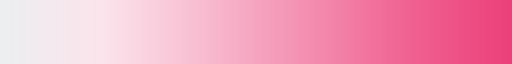

In [2]:
my_cmap

In [3]:
print("datasets colors")
set_palette

datasets colors


[(0.9294117647058824, 0.41568627450980394, 1.0),
 (0.7764705882352941, 1.0, 0.0),
 (0.14901960784313725, 0.7764705882352941, 0.8549019607843137)]

In [4]:
print("targets colors")
target_palette

targets colors


[(1.0, 0.6470588235294118, 0.0),
 (0.9882352941176471, 0.35294117647058826, 0.5529411764705883)]

# <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 3. Get and preview the datasets </p>

In [5]:
tr_00 = pd.read_csv('/kaggle/input/playground-series-s5e12/train.csv', index_col='id')
ts_00 = pd.read_csv('/kaggle/input/playground-series-s5e12/test.csv', index_col='id')
sb_00 = pd.read_csv('/kaggle/input/playground-series-s5e12/sample_submission.csv')

or_00 = pd.read_csv('/kaggle/input/diabetes-health-indicators-dataset/diabetes_dataset.csv')[tr_00.columns]

# or_00 = pd.read_csv('')

target = 'diagnosed_diabetes'


In [6]:
tr_00.head(5)

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,...,gender,ethnicity,education_level,income_level,smoking_status,employment_status,family_history_diabetes,hypertension_history,cardiovascular_history,diagnosed_diabetes
id,,,,,,,,,,,,,,,,,,,,,
0,31,1,45,7.7,6.8,6.1,33.4,0.93,112,70,...,Female,Hispanic,Highschool,Lower-Middle,Current,Employed,0,0,0,1.0
1,50,2,73,5.7,6.5,5.8,23.8,0.83,120,77,...,Female,White,Highschool,Upper-Middle,Never,Employed,0,0,0,1.0
2,32,3,158,8.5,7.4,9.1,24.1,0.83,95,89,...,Male,Hispanic,Highschool,Lower-Middle,Never,Retired,0,0,0,0.0
3,54,3,77,4.6,7.0,9.2,26.6,0.83,121,69,...,Female,White,Highschool,Lower-Middle,Current,Employed,0,1,0,1.0
4,54,1,55,5.7,6.2,5.1,28.8,0.90,108,60,...,Male,White,Highschool,Upper-Middle,Never,Retired,0,1,0,1.0


In [7]:
or_00.head()

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,...,gender,ethnicity,education_level,income_level,smoking_status,employment_status,family_history_diabetes,hypertension_history,cardiovascular_history,diagnosed_diabetes
0,58,0,215,5.7,7.9,7.9,30.5,0.89,134,78,...,Male,Asian,Highschool,Lower-Middle,Never,Employed,0,0,0,1
1,48,1,143,6.7,6.5,8.7,23.1,0.80,129,76,...,Female,White,Highschool,Middle,Former,Employed,0,0,0,0
2,60,1,57,6.4,10.0,8.1,22.2,0.81,115,73,...,Male,Hispanic,Highschool,Middle,Never,Unemployed,1,0,0,1
3,74,0,49,3.4,6.6,5.2,26.8,0.88,120,93,...,Female,Black,Highschool,Low,Never,Retired,0,0,0,1
4,46,1,109,7.2,7.4,5.0,21.2,0.78,92,67,...,Male,White,Graduate,Middle,Never,Retired,0,0,0,1


# <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 4. Explore the datasets </p>

## <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 4.1 Dataset info and  description </p>

In [8]:
print(f'shape of train set: {tr_00.shape}\nshape of test set: {ts_00.shape}\nshape of original set: {or_00.shape}')

shape of train set: (700000, 25)
shape of test set: (300000, 24)
shape of original set: (100000, 25)


In [9]:
for df in [tr_00, ts_00, or_00]:
    print(df.isna().sum().sum())
print('None of the three datasets is missing values!')

0
0
0
None of the three datasets is missing values!


In [10]:
tr_00.info()

<class 'pandas.core.frame.DataFrame'>
Index: 700000 entries, 0 to 699999
Data columns (total 25 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 700000 non-null  int64  
 1   alcohol_consumption_per_week        700000 non-null  int64  
 2   physical_activity_minutes_per_week  700000 non-null  int64  
 3   diet_score                          700000 non-null  float64
 4   sleep_hours_per_day                 700000 non-null  float64
 5   screen_time_hours_per_day           700000 non-null  float64
 6   bmi                                 700000 non-null  float64
 7   waist_to_hip_ratio                  700000 non-null  float64
 8   systolic_bp                         700000 non-null  int64  
 9   diastolic_bp                        700000 non-null  int64  
 10  heart_rate                          700000 non-null  int64  
 11  cholesterol_total              

In [11]:
for df in [tr_00]:
    df[target] = df[target].astype('category')

In [12]:
tr_00.describe().T.style.background_gradient(cmap=my_cmap)

,count,mean,std,min,25%,50%,75%,max
age,700000.000000,50.359734,11.655520,19.000000,42.000000,50.000000,58.000000,89.000000
alcohol_consumption_per_week,700000.000000,2.072411,1.048189,1.000000,1.000000,2.000000,3.000000,9.000000
physical_activity_minutes_per_week,700000.000000,80.230803,51.195071,1.000000,49.000000,71.000000,96.000000,747.000000
diet_score,700000.000000,5.963695,1.463336,0.100000,5.000000,6.000000,7.000000,9.900000
sleep_hours_per_day,700000.000000,7.002200,0.901907,3.100000,6.400000,7.000000,7.600000,9.900000
screen_time_hours_per_day,700000.000000,6.012733,2.022707,0.600000,4.600000,6.000000,7.400000,16.500000
bmi,700000.000000,25.874684,2.860705,15.100000,23.900000,25.900000,27.800000,38.400000
waist_to_hip_ratio,700000.000000,0.858766,0.037980,0.680000,0.830000,0.860000,0.880000,1.050000
systolic_bp,700000.000000,116.294193,11.010390,91.000000,108.000000,116.000000,124.000000,163.000000
diastolic_bp,700000.000000,75.440924,6.825775,51.000000,71.000000,75.000000,80.000000,104.000000


In [13]:
tr_00.describe(exclude='number').T

,count,unique,top,freq
gender,700000,3,Female,363237
ethnicity,700000,5,White,386153
education_level,700000,4,Highschool,344145
income_level,700000,5,Middle,290557
smoking_status,700000,3,Never,494448
employment_status,700000,4,Employed,516170
diagnosed_diabetes,700000.0,2.0,1.0,436307.0


In [14]:
num_feats = [feat for feat in ts_00.select_dtypes(include='number').columns.tolist() if ts_00[feat].nunique()>2]

In [15]:
bool_feats = [feat for feat in ts_00.select_dtypes('number') if ts_00[feat].nunique()==2]
cat_feats = ts_00.select_dtypes(exclude='number').columns.tolist()

cat_and_bool_feat = cat_feats + bool_feats

## <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 4.2 Count of target claasses in train data </p>

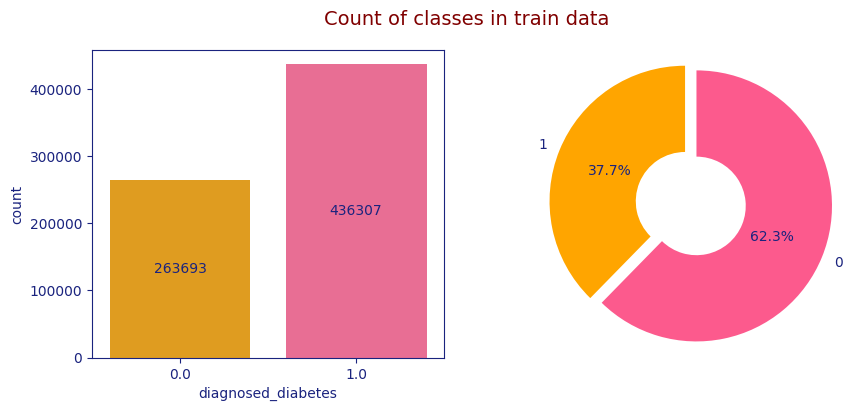

In [16]:
plt.figure(figsize=(10, 4))

plt.subplot(121)
ax = sns.countplot(tr_00, x=target, palette=target_colors)
for count in ax.containers:
    ax.bar_label(count, label_type='center')

plt.subplot(122)
tr_00[target].value_counts().sort_values(ascending=True).plot.pie(labels=['1', '0'], 
                                     autopct='%1.1f%%', \
                                     explode=[0.05, 0.05],
                                     colors=target_colors,
                                     startangle=90,
                                     radius=1.1,
                                     wedgeprops={'width': 0.7},
                                     # title='Proportion of classes in train data'
                                     )
plt.ylabel('')

plt.suptitle('Count of classes in train data', color='maroon', fontsize=14)

plt.show()

## <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 4.3 Compare distributions in train and test sets </p>

### <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 4.3.1 Adveserial validation </p>

In [17]:
tr_comb = pd.concat([tr_00, or_00], ignore_index=True)
print('Combine the train and original datasets.')

Combine the train and original datasets.


In [18]:
# Define a function to perform the adversarial validation of two datasets
def adversarial_validation(df_1, df_2, name_1, name_2):
    adv_df_1 = df_1[num_features].copy()
    adv_df_2 = df_2[num_features].copy()


    # label the test and train data with 0 and 1 (it doesn't really matter which is which)
    adv_df_1 = adv_df_1.assign(adv=1)
    adv_df_2 = adv_df_2.assign(adv=0)

    # combine the training and test data into one big dataset
    combined = pd.concat([adv_df_1, adv_df_2], axis=0)

    # Shuffle
    combined = combined.sample(frac=1, random_state=64)

    # perform the binary classification, for example using XGboost
    X_combined = combined.drop('adv', axis=1)
    y_combined = combined.adv
    
    # Define the classifier
    clf = xgb.XGBClassifier(verbose=0, n_estimators=50)

    # Get the cross validation scores
    adv_scores = []
    X_train, X_valid, y_train, y_valid = train_test_split(X_combined, 
                                                          y_combined, 
                                                          test_size=0.3)
    clf.fit(X_train, y_train)
    y_pred = clf.predict_proba(X_valid)[:,1]
    score = metrics.roc_auc_score(y_valid, y_pred)
    adv_scores.append(score)

    #Plot the roc_curve
    mean_auc = np.mean(adv_scores)
    fpr, tpr, _ = metrics.roc_curve(y_valid, y_pred)
    plt.plot(fpr, tpr, label = 'roc_curve (AUC = %0.4f)' % mean_auc)
    plt.plot([0,1], [0,1], linestyle = '--', color = '#d84315', label = 'Random Guess')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'roc_curve {name_1} vs {name_2}', weight='bold')
    plt.legend()

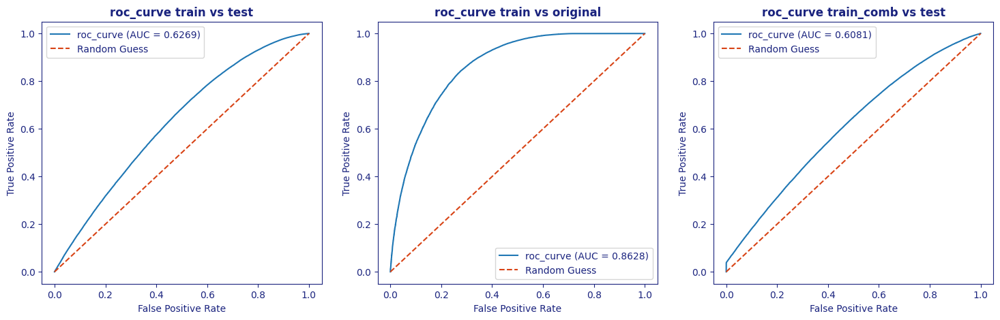

In [19]:
num_features = list(ts_00.select_dtypes('number'))
plt.figure(figsize=(18,5))
plt.subplot(1,3,1)
adversarial_validation(tr_00, ts_00, 'train', 'test')
plt.subplot(1,3,2)
adversarial_validation(ts_00, or_00, 'train', 'original')
plt.subplot(1,3,3)
adversarial_validation(tr_comb, ts_00, 'train_comb', 'test')

<p style="
  font-family: Calibri;
  font-weight: bold;
  letter-spacing: 0.5px;
  color: gold;
  border-radius: 1px;
  font-size: 120%;
  text-align: left;
  padding: 10px;
  background: #1a237e;
  border-bottom: 5px #e91e63;
  border-left: 10px #e91e63;
  line-height: 3.;
">
    As shown by the roc_curves and auc scores, our week classifier is able to some extend to distinguish between the three datasets (train, test and original). This suggest that the three datasets are not "perfectly" from the same distribution. This was expected of the original data, as clearly stated by the competition organizer. But seems strange for the train and test sets. This might impact the performane of our models.
</p>

### <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 4.3.2 The distributions </p>

In [20]:
def plot_num_distribution_grid(df, num_feats=num_feats, grouper=target, palette=target_palette, bins=50, ncols=3):
    """
    Plot histograms + boxplots for numerical features in a grid layout.
    Each feature gets two stacked subplots (hist + box) with boxplot 1/3 height of histplot.
    Both plots share the same x-axis.
    """
    df[target] = df[target].astype('category')
    nrows = int(np.ceil(len(num_feats) / ncols))

    fig = plt.figure(figsize=(ncols*6, nrows*6))
    gs = fig.add_gridspec(nrows=nrows, ncols=ncols, hspace=0.4)

    for i, feat in enumerate(num_feats):
        row = i // ncols
        col = i % ncols

        # Sub-grid with height ratio 3:1 and shared x-axis
        sub_gs = gs[row, col].subgridspec(2, 1, height_ratios=[3, 1])
        ax_hist = fig.add_subplot(sub_gs[0])
        ax_box = fig.add_subplot(sub_gs[1], sharex=ax_hist)

        # Histogram
        sns.histplot(data=df, x=feat, hue=grouper, bins=bins,
                     palette=palette, multiple="dodge", ax=ax_hist, kde=True)
        ax_hist.set_title(f"{feat} distribution", fontsize=11.5, color='maroon')
        ax_hist.set_xlabel('')  # Remove x-label from histogram
        ax_hist.tick_params(axis='x', labelbottom=False)  # Hide x-ticks on histogram

        # Boxplot (horizontal to match x-axis)
        sns.boxplot(data=df, x=feat, y=grouper, palette=palette,
                    ax=ax_box,
                    flierprops=dict(marker='o', markerfacecolor='red',
                                    markeredgecolor='gold', markersize=3))
        plt.ylabel('')

    plt.tight_layout(pad=1, h_pad=0.2, w_pad=2)
    plt.show()

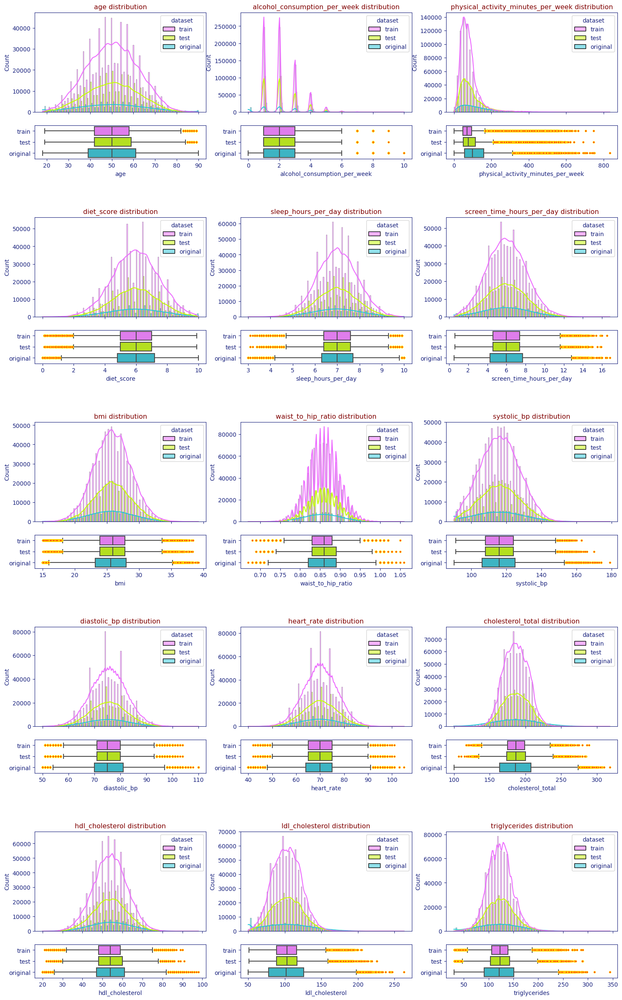

In [21]:
# Save copies of the datasets
tr_r = tr_00.copy()
ts_r = ts_00.copy()
or_r = or_00.copy()

# Add an identification columns to each features
tr_r['dataset'] = 'train'
ts_r['dataset'] = 'test'
or_r['dataset'] = 'original'

# Combine the datasets
tr_all_sets = pd.concat([tr_r, ts_r, or_r], ignore_index=True)

# Plot the distribution chart for each dataset
plot_num_distribution_grid(tr_all_sets, grouper='dataset', palette=set_palette)

## <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 4.4 Compare distributions when grouped by diagnosis </p>

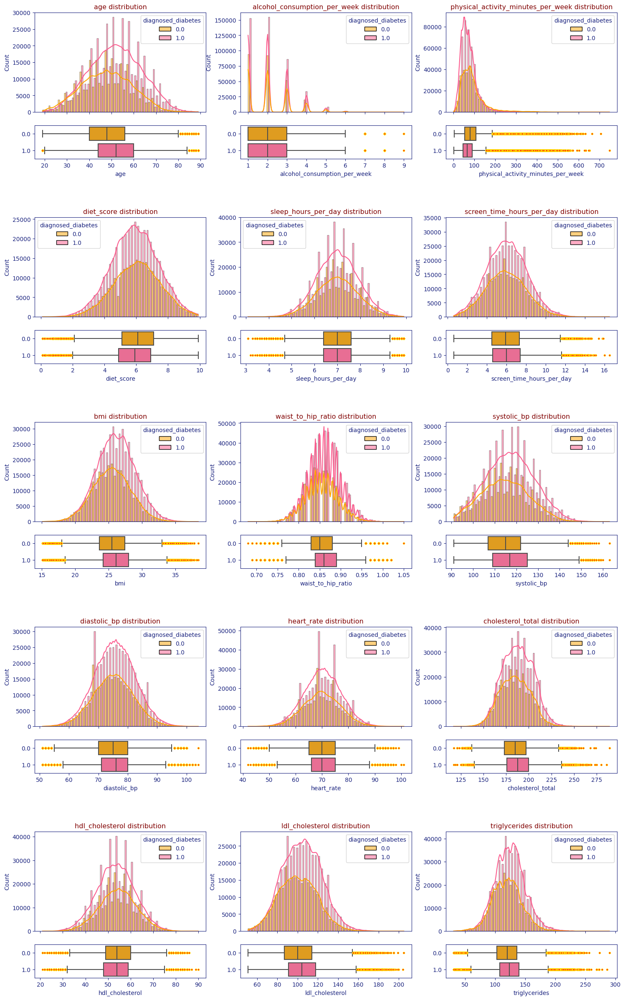

In [22]:
plot_num_distribution_grid(tr_00, grouper=target)

## <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 4.5 Count of categories </p>

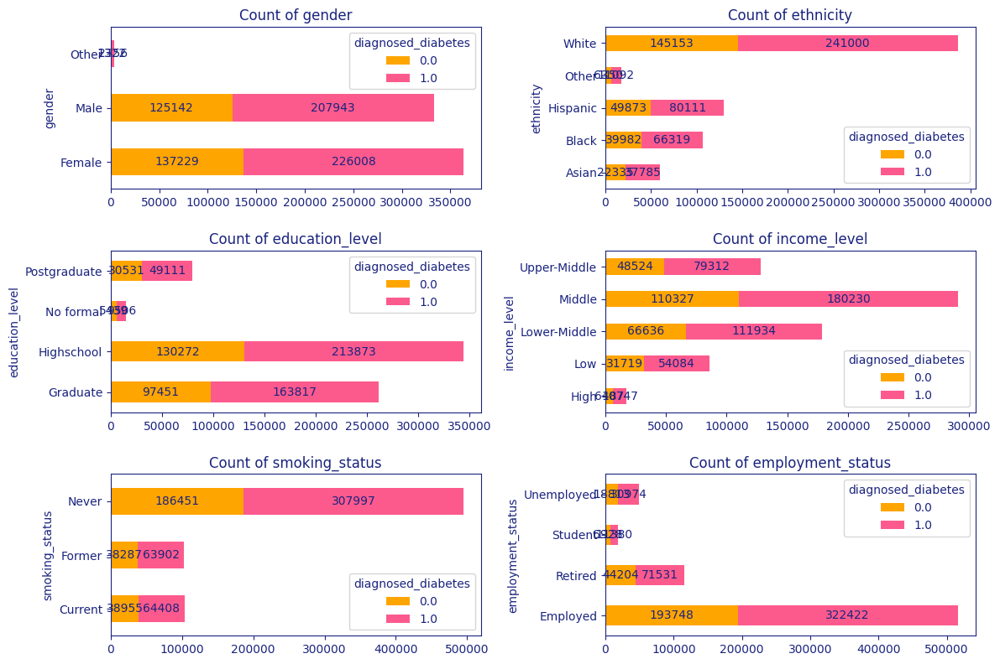

In [23]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

for f, feat in enumerate(cat_feats, 1):
    plt.subplot(3, 2, f)
    
    # Create counts of target per category
    counts = tr_00.groupby([feat, target]).size().unstack(fill_value=0)
    
    # Horizontal bar plot
    ax = counts.plot.barh(
        stacked=True, ax=plt.gca(), legend=True, color=target_colors)
    ax.set_title(f'Count of {feat}')
    
    # Add labels inside bars
    for container in ax.containers:
        ax.bar_label(container, label_type='center')

plt.tight_layout(pad=1, h_pad=2, w_pad=1)
plt.show()

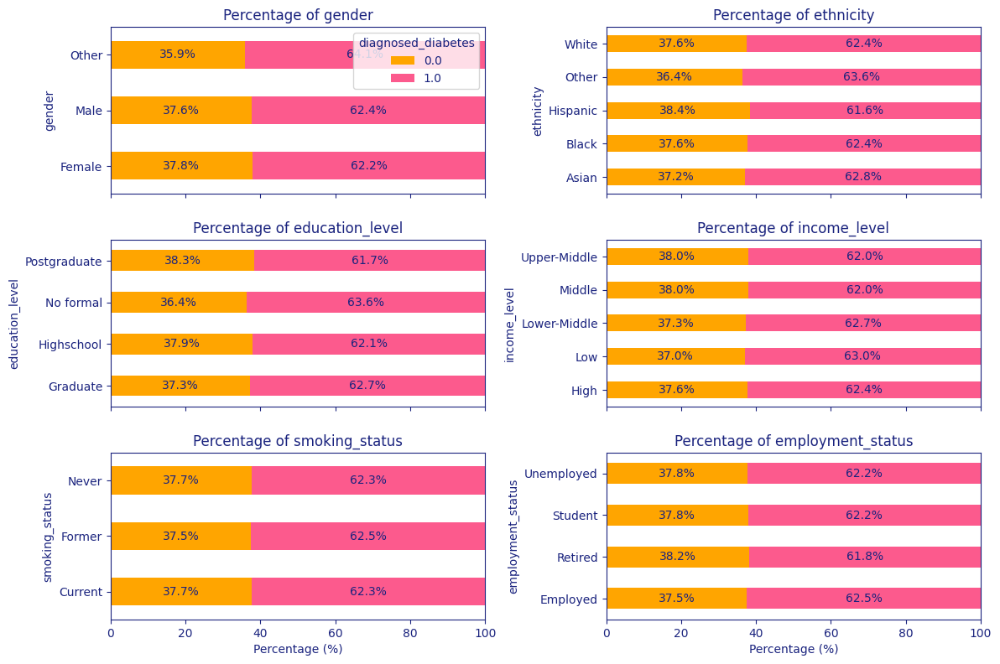

In [24]:
n_feats = len(cat_feats)
n_rows = (n_feats + 1) // 2   # auto rows for 2 columns
fig, axes = plt.subplots(n_rows, 2, figsize=(12, 8), sharex=True)

axes = axes.flatten()  # flatten for easy indexing

for f, feat in enumerate(cat_feats):
    ax = axes[f]
    
    # Compute counts of target per category
    counts = tr_00.groupby([feat, target]).size().unstack(fill_value=0)
    
    # Convert to percentages row-wise
    percentages = counts.div(counts.sum(axis=1), axis=0) * 100
    
    # Horizontal stacked bar plot with custom colors
    percentages.plot.barh(
        stacked=True, 
        ax=ax, 
        legend=(f==0),   # show legend only on first subplot
        color=target_colors
    )
    
    ax.set_title(f'Percentage of {feat}')
    ax.set_xlim(0, 100)  # shared axis ensures all bars span 0–100
    ax.set_xlabel("Percentage (%)")
    
    # Add percentage labels inside bars
    for container in ax.containers:
        ax.bar_label(container, fmt="%.1f%%", label_type='center')

# Hide any unused subplot slots
for j in range(f+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(pad=1, h_pad=2, w_pad=1)
plt.show()

## <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 4.6 Correlations (absolute values) </p>

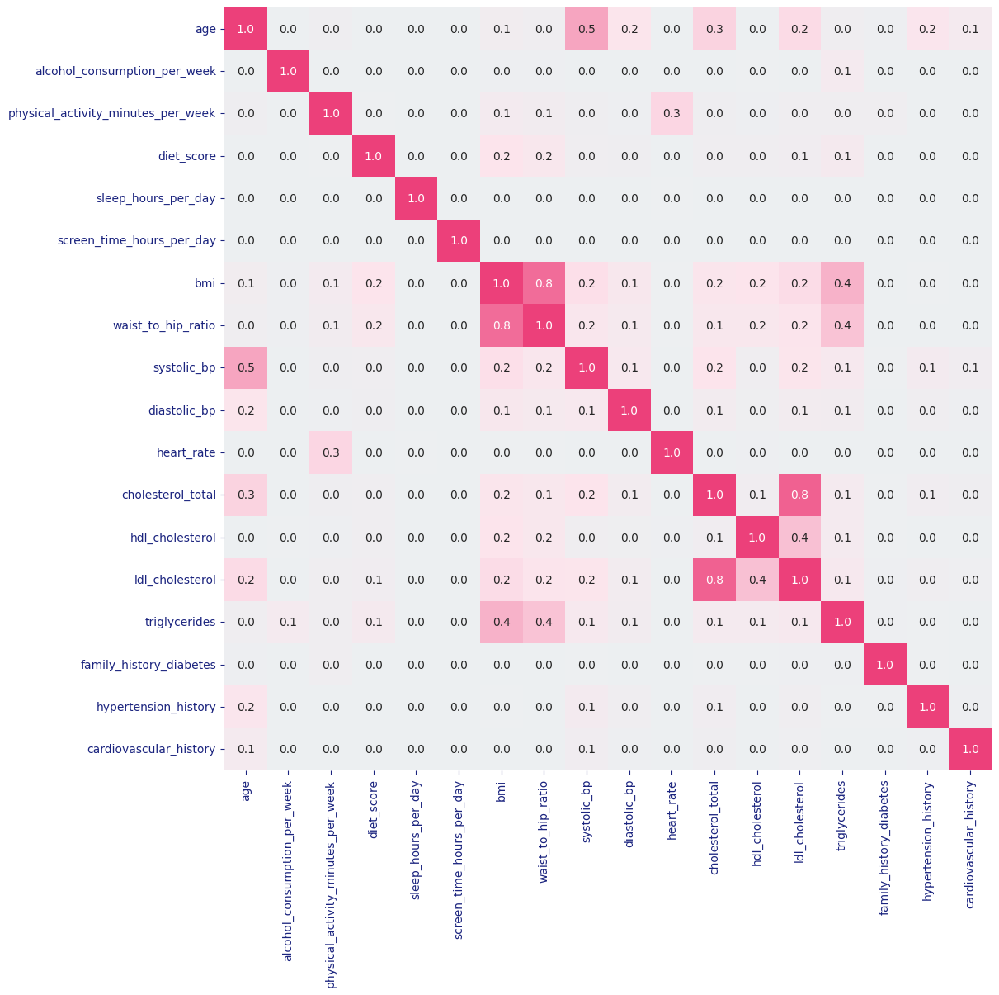

In [25]:
tr_corr_abs = np.abs(tr_00.corr(numeric_only=True))
mask = tr_corr_abs > 0.1
plt.figure(figsize=(12, 12))
sns.heatmap(tr_corr_abs, annot=True, fmt='.1f', cmap=my_cmap, cbar=False)
plt.show()

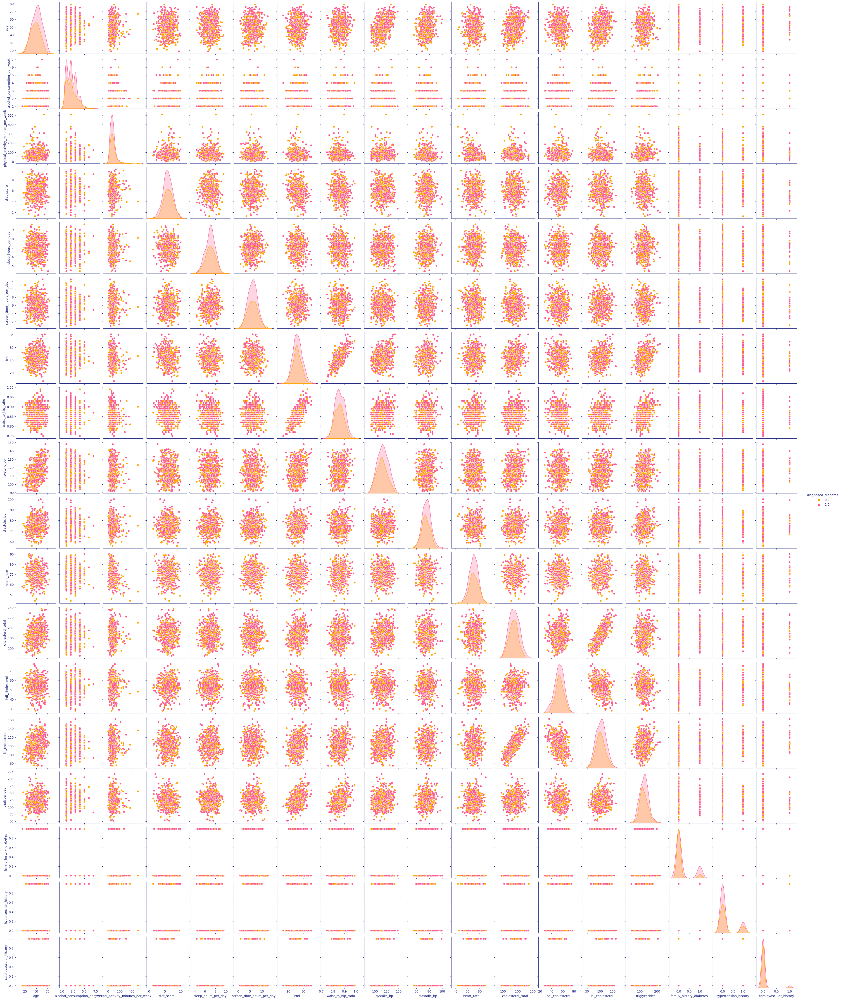

In [26]:
sns.pairplot(tr_00.sample(600), hue=target, palette=target_palette, aspect=0.8)
plt.show()

# <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 5. Model Preparation </p>

<div style="text-align: center;">
  <img src="https://miro.medium.com/0*zdmqFZ2nooBRedqC.png" width="500" style="border: 1px solid #17202a; border-radius: 1px;" />
</div>

## <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 5.1 Prep the data and Fit the Model </p>

### <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > Should we get some new features? </p>

In [27]:
run_feat_eng = True
cross_combine_cat_feats = False

if run_feat_eng:
    # create new feature
    for df in [tr_00, ts_00, or_00, tr_comb]:
        df['diasto_to_systo'] = np.divide(df['diastolic_bp'], df['systolic_bp'])
        df['hdl_cholesterol_to_total'] = np.divide(df['hdl_cholesterol'], df['cholesterol_total'])
        df['ldl_cholesterol_to_total'] = np.divide(df['ldl_cholesterol'], df['cholesterol_total'])
        df['waistHip_to_bmi'] = np.divide(df['waist_to_hip_ratio'], df['bmi'])
        df['heartRate_to_bmi'] = np.divide(df['heart_rate'], df['bmi'])
        df['triglycerides_to_cholesterol'] = np.divide(df['triglycerides'], df['cholesterol_total'])
        df['histories'] = df['family_history_diabetes'] + df['hypertension_history'] + df['cardiovascular_history']
        df['bmi_class'] = pd.cut(df['bmi'], [0, 18.5, 25, 30, 35, 40, 100], labels=[1, 2, 3, 4, 5, 6])
        df.drop(columns=['bmi'], inplace=True)
        if cross_combine_cat_feats:
            # Generate unique pairs without repetition
            for feat_1, feat_2 in combinations(cat_and_bool_feat, 2):
                # Concatenate as strings to create interaction feature
                df[f'{feat_1}_{feat_2}'] = df[feat_1].astype(str) + '_' + df[feat_2].astype(str)
            else:
                pass
            
    else:
        pass
    
tr_00.head(3)

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,waist_to_hip_ratio,systolic_bp,diastolic_bp,heart_rate,...,cardiovascular_history,diagnosed_diabetes,diasto_to_systo,hdl_cholesterol_to_total,ldl_cholesterol_to_total,waistHip_to_bmi,heartRate_to_bmi,triglycerides_to_cholesterol,histories,bmi_class
id,,,,,,,,,,,,,,,,,,,,,
0,31,1,45,7.7,6.8,6.1,0.93,112,70,62,...,0,1.0,0.625000,0.291457,0.572864,0.027844,1.856287,0.512563,0,4
1,50,2,73,5.7,6.5,5.8,0.83,120,77,71,...,0,1.0,0.641667,0.251256,0.608040,0.034874,2.983193,0.623116,0,2
2,32,3,158,8.5,7.4,9.1,0.83,95,89,73,...,0,0.0,0.936842,0.313830,0.606383,0.034440,3.029046,0.574468,0,2


### <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > Turn all non numeric features to categorical: needed for xgb </p>

In [28]:
# Get the list of cat features from the engineered data
cat_feats_eng = ts_00.select_dtypes(exclude='number').columns.tolist()


for df in [tr_00, ts_00, or_00, tr_comb]:
    for feat in cat_feats_eng:
        df[feat] = df[feat].astype('category')

In [29]:
ts_00.info()

<class 'pandas.core.frame.DataFrame'>
Index: 300000 entries, 700000 to 999999
Data columns (total 31 columns):
 #   Column                              Non-Null Count   Dtype   
---  ------                              --------------   -----   
 0   age                                 300000 non-null  int64   
 1   alcohol_consumption_per_week        300000 non-null  int64   
 2   physical_activity_minutes_per_week  300000 non-null  int64   
 3   diet_score                          300000 non-null  float64 
 4   sleep_hours_per_day                 300000 non-null  float64 
 5   screen_time_hours_per_day           300000 non-null  float64 
 6   waist_to_hip_ratio                  300000 non-null  float64 
 7   systolic_bp                         300000 non-null  int64   
 8   diastolic_bp                        300000 non-null  int64   
 9   heart_rate                          300000 non-null  int64   
 10  cholesterol_total                   300000 non-null  int64   
 11  hdl_cholester

### <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > Separate X and y. Do I need to include the original data? </p>

In [30]:
# Decide if the external data should be included to the train set
include_external = True

# Split the train set into data and target
if include_external:
    print("The original dataset is combined to the train set.")
    X = tr_comb.copy() # use the train_orig combined dataset
else:
    print("The train set is used alone without including the original data.")
    X = tr_00.copy() # use only the train set
y = X.pop(target)

# Prepare a separate original data and target
X_or = or_00.copy()
y_or = X_or.pop(target)

The original dataset is combined to the train set.


### <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > Configure the model </p>

In [31]:
# Define parameters
params = {
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'max_depth': 4,
    'learning_rate': 0.025,
    'min_child_weight': 3,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'lambda': 10,   # L2 regularization
    'alpha': 2,    # L1 regularization
    # 'tree_method': 'gpu_hist',
    'random_state': seed,
}

print("Here are the hyperparameters that are used:")
params

Here are the hyperparameters that are used:


{'objective': 'binary:logistic',
 'eval_metric': 'auc',
 'max_depth': 4,
 'learning_rate': 0.025,
 'min_child_weight': 3,
 'subsample': 0.8,
 'colsample_bytree': 0.8,
 'lambda': 10,
 'alpha': 2,
 'random_state': 68}

## <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 5.2 Crossvalidation of the Model and Prediction on Test </p>

🚨 Fitting Fold_1 ⪥⪥⪥⪥⪥⪥⪥⪥⪥⪥⪥⪥⪥⪥
[0]	train-auc:0.66708	validation-auc:0.66576
[200]	train-auc:0.69937	validation-auc:0.69765
[400]	train-auc:0.70664	validation-auc:0.70393
[600]	train-auc:0.71146	validation-auc:0.70798
[800]	train-auc:0.71468	validation-auc:0.71025
[1000]	train-auc:0.71711	validation-auc:0.71187
[1200]	train-auc:0.71911	validation-auc:0.71303
[1400]	train-auc:0.72079	validation-auc:0.71382
[1600]	train-auc:0.72228	validation-auc:0.71444
[1800]	train-auc:0.72364	validation-auc:0.71495
[2000]	train-auc:0.72485	validation-auc:0.71532
[2200]	train-auc:0.72604	validation-auc:0.71565
[2400]	train-auc:0.72710	validation-auc:0.71589
[2600]	train-auc:0.72817	validation-auc:0.71614
[2800]	train-auc:0.72919	validation-auc:0.71634
[3000]	train-auc:0.73018	validation-auc:0.71651
[3200]	train-auc:0.73110	validation-auc:0.71664
[3360]	train-auc:0.73182	validation-auc:0.71672
Fold_1 ==> auc: 0.716723 on validation data ✅
Fold_1 ==> auc: 0.683270 on original data   ⚠️

🚨 Fitting Fold_2 

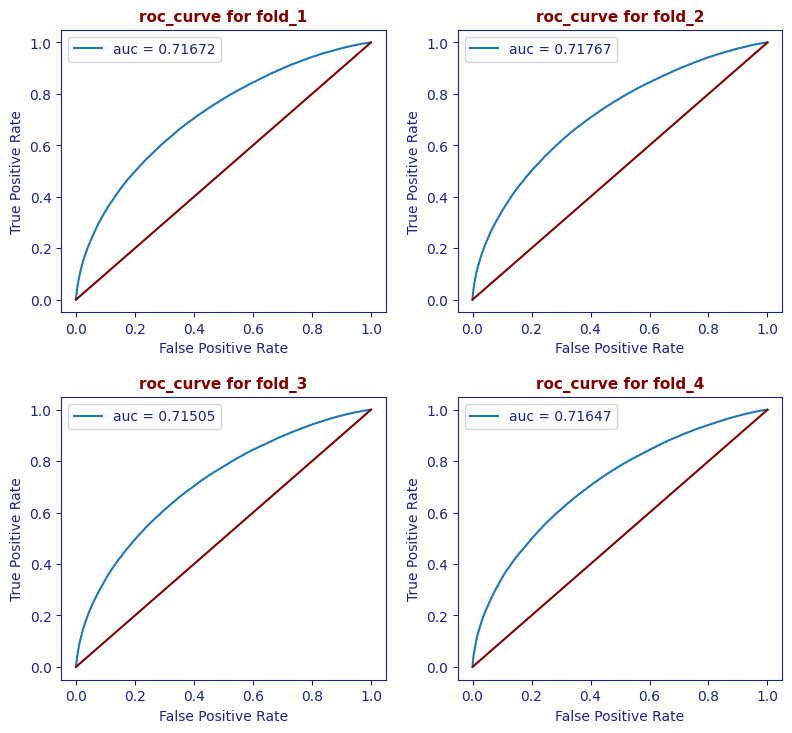

In [32]:
n_splits = 4
spliter = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)

test_pred_proba = pd.DataFrame()

plt.figure(figsize=(8, 18))

for f, (tr_ind, va_ind) in enumerate(spliter.split(X, y), 1):
    print('🚨 ' + f'Fitting Fold_{f} ' + 14*'⪥')

    # Split train/validation
    X_tr, X_va = X.iloc[tr_ind], X.iloc[va_ind]
    y_tr, y_va = y.iloc[tr_ind], y.iloc[va_ind]

    # Convert to DMatrix
    dtrain = xgb.DMatrix(X_tr, label=y_tr, enable_categorical=True)
    dval   = xgb.DMatrix(X_va, label=y_va, enable_categorical=True)
    dtest  = xgb.DMatrix(ts_00, enable_categorical=True)
    dorig = xgb.DMatrix(X_or, label=y_or, enable_categorical=True)

    # Train with early stopping
    evals = [(dtrain, 'train'), (dval, 'validation')]
   
    model = xgb.train(
        params,
        dtrain,
        num_boost_round=4000,
        evals=evals,
        early_stopping_rounds=20,
        verbose_eval=200
    )

    # Predict on validation with best iteration
    pred_va = model.predict(dval, iteration_range=(0, model.best_iteration))
    score_va = metrics.roc_auc_score(y_va, pred_va)
    print(f'Fold_{f} ==> auc: {score_va:.6f} on validation data ✅')

    # Predict on the original data with best iteration
    pred_or = model.predict(dorig, iteration_range=(0, model.best_iteration))
    score_or = metrics.roc_auc_score(y_or, pred_or)
    print(f'Fold_{f} ==> auc: {score_or:.6f} on original data   ⚠️\n')

    # Predict on test set with best iteration
    test_pred_proba[f'y_test_proba_fold_{f}'] = model.predict(dtest, iteration_range=(0, model.best_iteration))

    # Plot ROC curve for each of the folds
    fpr, tpr, _ = metrics.roc_curve(y_va, pred_va)
    plt.subplot(5, 2, f)
    plt.plot(fpr, tpr, label=f'auc = {score_va:.5f}')
    plt.plot([0, 1], [0, 1], color='maroon')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.title(f'roc_curve for fold_{f}', color='maroon', fontsize=11, weight='bold')

plt.tight_layout(pad=1, h_pad=1.5, w_pad=1.5)
plt.show()


### <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > Average the predictions of all folds </p>

In [33]:
test_pred_proba['average_proba'] = test_pred_proba.mean(axis=1)

test_pred_proba.head()

,y_test_proba_fold_1,y_test_proba_fold_2,y_test_proba_fold_3,y_test_proba_fold_4,average_proba
0,0.502753,0.499037,0.491710,0.468939,0.490610
1,0.692932,0.695042,0.691921,0.686445,0.691585
2,0.746320,0.758089,0.769546,0.758955,0.758227
3,0.396618,0.426037,0.427700,0.431835,0.420547
4,0.903312,0.896631,0.902994,0.894120,0.899264


## <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > 5.3 Prepare the submission dataframe </p>

In [34]:
use_one_fold = True

fold = 1

if use_one_fold:
    final_prediction = f'y_test_proba_fold_{fold}'
else:
    final_prediction = 'average_proba'

sb_00[target] = test_pred_proba[final_prediction]

print(f"We are using {final_prediction} as the final prediction for aour test data")

We are using y_test_proba_fold_1 as the final prediction for aour test data


In [35]:
sb_00.head()

,id,diagnosed_diabetes
0,700000,0.502753
1,700001,0.692932
2,700002,0.746320
3,700003,0.396618
4,700004,0.903312


### <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > What is the distribution of the probabilities predicted on the test data? </p>

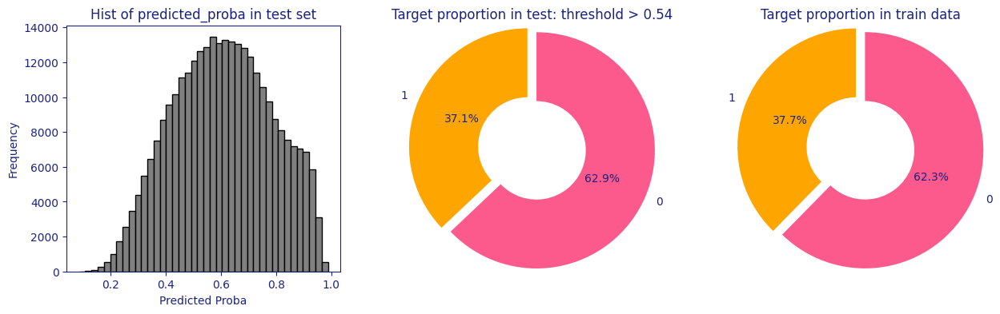

In [36]:
# The threshold for assigning the class from predicted probabilities
threshold = 0.54


plt.subplot(131)
sb_00[target].plot.hist(bins=40, color='gray', 
                        figsize=(15, 4), edgecolor='k', 
                        title='Hist of predicted_proba in test set')
plt.xlabel('Predicted Proba')

plt.subplot(132)
(sb_00[target] > threshold).value_counts().sort_values(ascending=True).plot.pie(labels=['1', '0'], 
                                             autopct='%1.1f%%', 
                                             explode=[0.05, 0.05],
                                             colors=target_colors,
                                             startangle=90,
                                             radius=1.2,
                                             wedgeprops={'width': 0.7},
                                             title=f'Target proportion in test: threshold > {threshold}'
                                             )
plt.ylabel('')

plt.subplot(133)
tr_00[target].value_counts().sort_values(ascending=True).plot.pie(labels=['1', '0'], 
                                             autopct='%1.1f%%', 
                                             explode=[0.05, 0.05],
                                             colors=target_colors, 
                                             startangle=90,
                                             radius=1.2,
                                             wedgeprops={'width': 0.7},
                                             title='Target proportion in train data'
                                             )
plt.ylabel('')
plt.show()

<p style="
  font-family: Calibri;
  font-weight: bold;
  letter-spacing: 0.5px;
  color: gold;
  border-radius: 1px;
  font-size: 150%;
  text-align: left;
  padding: 10px;
  background: #1a237e;
  border-bottom: 5px #e91e63;
  border-left: 10px #e91e63;
  line-height: 3.;
">
Not very encouraging to see that <span style="color:orange;"> the median of the predicted probablities</span> lies around  
  <span style="color: red;"> 0.6. <span style="color: lightgreen;"> It looks as if the predictions are from a guess work.</span> <span style="color: white;"> Since we got very low (about 0.72) train and volidation scores, this was to be expected. The model even performed worst on the original data. Let's, however, submit our file to the competion and find out what we get.</span>

<div style="text-align: center;">
  <img src="https://media.istockphoto.com/id/924215138/vector/yellow-thinking-face-vector-icon.jpg?s=612x612&w=0&k=20&c=IvLalSuyXKkOWft41wXzXeU7MJMDIJuE9NGCOn01Ip4=" width="380" style="border: 1px solid #17202a; border-radius: 1px;" />
</div>
</p>

### <p style= "font-family: Calibri; font-weight:bold; letter-spacing: 0px; color: #1a237e; border-radius:15px; font-size:100%; text-align:left;padding:10px; background: #fc5a8d; border-top: 5px solid black; border-left: 10px solid black" > Get the submission file </p>

In [37]:
sb_00.to_csv('submission.csv', index=False)
print('✨✨✨ Ready to submit! ✨✨✨')

✨✨✨ Ready to submit! ✨✨✨


<div style="width:1000px; height:300px; overflow:hidden; text-align:center; margin:auto;">
  <img src="https://childrensfriendri.org/wp-content/uploads/2020/12/ThankYou-1.jpg"
       style="width:100%; height:100%; object-fit:cover;" />
</div>